In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

import sctk as sk
import seaborn

import celltypist
from celltypist import models

In [2]:
adata = sc.read_h5ad("../data/rna/scRNA_batch1_2.processed.fibroblasts.h5ad")

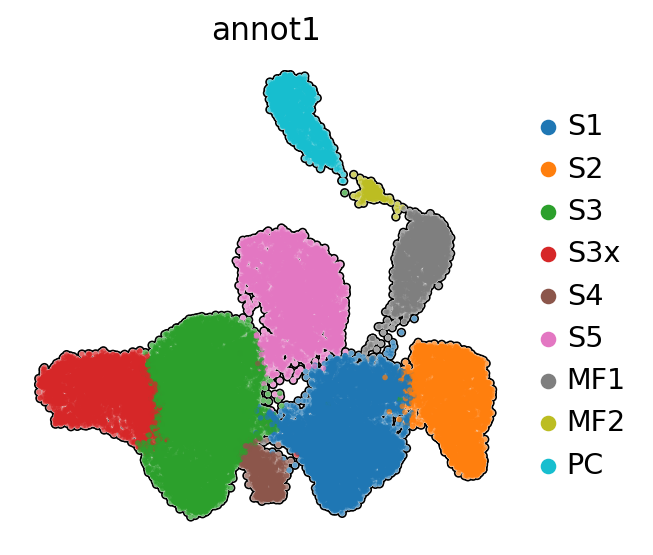

In [18]:
sc.pl.umap(
    adata,
    color='annot1',
    palette='tab10',
    frameon=False,
    size=25,  # point size
    add_outline=True,
    #legend_loc='on data',
    #save='UMAP_RNA_fibroblast_MF_PC_outline.pdf'  # in ./figures
)

# CellTypist models

In [3]:
# Load celltypist models of fibroblasts from Friedrich (our) study
#model_fibro = models.Model.load("../fibroblast_reanalysis_celltypist/celltypist/friedrich_fibroblasts.pkl")

In [4]:
#model_fibro

In [5]:
# Healthy + disease megagut levels at 3 levels
model_megagutSmallIntestineDisease_lvl1 = models.Model.load("../fibroblast_reanalysis_celltypist/celltypist/megagutSmallIntestine_lvl1.pkl")

In [6]:
model_megagutSmallIntestineDisease_lvl3 = models.Model.load("../fibroblast_reanalysis_celltypist/celltypist/megagutSmallIntestine_lvl3.pkl")

In [7]:
# Run celltypist on data, healthy only
# 1h runtime for 250k cells
predictions_megagutSmall = celltypist.annotate(
    adata,
    model = model_megagutSmallIntestineDisease_lvl3,
    majority_voting = True,
    mode = 'best match',
)

👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 26727 cells and 17592 genes
🔗 Matching reference genes in the model
🧬 17146 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 15
🗳️ Majority voting the predictions
✅ Majority voting done!


In [8]:
adata = predictions_megagutSmall.to_adata(prefix='megagut_lvl3_')

In [9]:
adata

AnnData object with n_obs × n_vars = 26727 × 17590
    obs: 'doublet_bh_pval', 'n_counts', 'sample_id', 'scrublet_score', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'percent_ribo', 'percent_hb', 'percent_top50', 'GEX_SID', 'ATAC_SID', 'GEX', 'ATAC', 'Sample', 'DOB', 'Gender', 'date', 'age_years', 'state', 'disease', 'site_taken_fine', 'site_taken_broad', 'sorted', 'Nancy_histologic_score', 'slide_look_other', 'whole_tissue_signature', 'scSeq', 'bulkSeq', 'annot_batch1_lr', 'annot_batch1_lr_prob', 'annot_batch2_lr', 'annot_batch2_lr_prob', 'leiden_bk_r0_1', 'leiden_bk_r0_3', 'leiden_bk_r0_5', 'is_doublet', 'leiden_bk_split1', 'leiden_bk_split2', 'leiden_bk_split3', 'annot1', 'leiden_bk_split4', 'annot_gut_lr', 'annot_gut_lr_prob', 'broad_annot1', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score'
    var: 'gene_ids', 'mito', 'ribo', 'hb', 'n_counts', 'n_cells', 'cc', 'highly_variable', 'highly_var

In [10]:
# App

In [11]:
sc.set_figure_params(figsize=(4,4), dpi_save=300)

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
name pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 57 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'V', 'X', 'Y', 'a', 'b', 'c', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'i', 'j', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'x', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 53, 54, 55, 57, 59, 60, 66, 68, 69, 70, 72, 73, 74, 75, 76, 77, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 91, 92]
Closed glyph list over 'GSUB': 62 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'V', 'X',

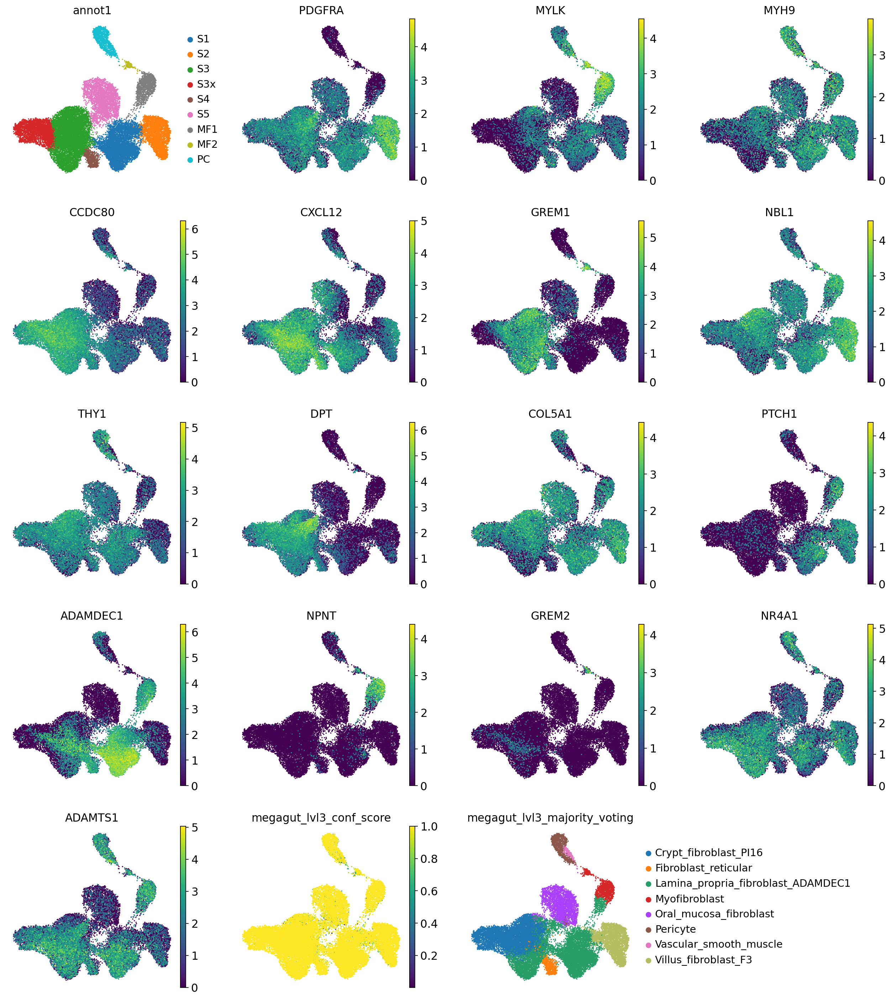

In [26]:
sc.pl.umap(
    adata,
    color=['annot1',
        # fibroblast vs contractile markers   
        "PDGFRA", "MYLK", "MYH9", "CCDC80", "CXCL12",
        # S3_oral_mucosal_fibro markers
        'GREM1', 'NBL1', 'THY1', 'DPT', 'COL5A1',
        # myofibroblast markers
        'PTCH1', 'ADAMDEC1', 'NPNT', 'GREM2', 'NR4A1', 'ADAMTS1',
        "megagut_lvl3_conf_score", "megagut_lvl3_majority_voting"],
    frameon=False,
    size=10,  # point size
    save='_myofibroblasts_CellTypist.pdf'  # in ./figures
)

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
name pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 24 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'F', 'G', 'M', 'N', 'P', 'S', 'T', 'a', 'five', 'four', 'n', 'nonmarkingreturn', 'o', 'one', 'space', 't', 'three', 'two', 'x', 'zero']
Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 37, 38, 41, 42, 48, 49, 51, 54, 55, 68, 81, 82, 87, 91]
Closed glyph list over 'GSUB': 24 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'F', 'G', 'M', 'N', 'P', 'S', 'T', 'a', 'five', 'four', 'n', 'nonmarkingreturn', 'o', 'one', 'space', 't', 'three', 'two', 'x', 'zero']
Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 37, 38, 41, 42, 48, 49, 51, 54, 55, 68, 81, 82, 87, 91]
Closing glyph list over 'MATH': 24 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'F', 'G', 'M', 'N', 'P', 'S', 'T', 'a', 'five', 'four', 'n', 'nonmarkingre

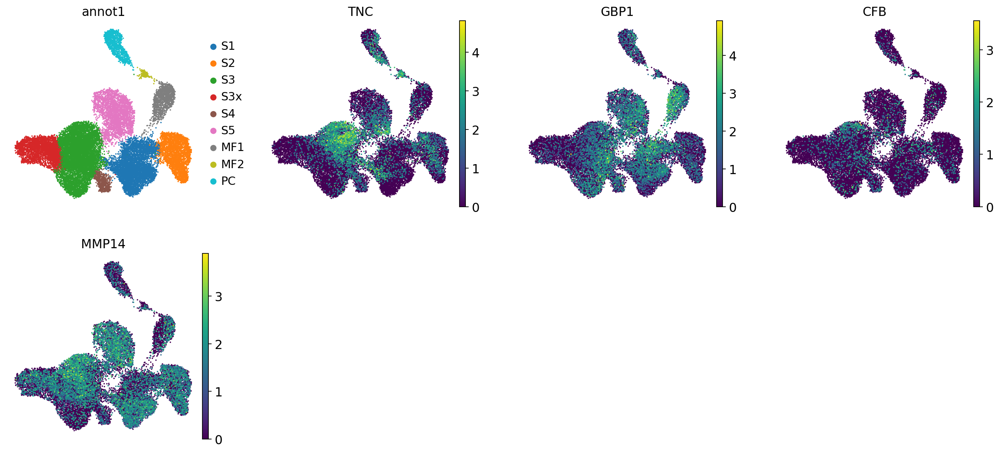

In [34]:
sc.pl.umap(
    adata,
    color=['annot1',
        # fibroblast vs contractile markers   
        'TNC', 'GBP1', 'CFB', 'MMP14'
    ],
    frameon=False,
    size=10,  # point size
    save='_myofibroblasts_CellTypist2.pdf'  # in ./figures
)

# S3 subset

In [20]:
adata_sub = adata[adata.obs.annot1 == 'S3']

In [21]:
adata_sub

View of AnnData object with n_obs × n_vars = 8295 × 17590
    obs: 'doublet_bh_pval', 'n_counts', 'sample_id', 'scrublet_score', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'percent_ribo', 'percent_hb', 'percent_top50', 'GEX_SID', 'ATAC_SID', 'GEX', 'ATAC', 'Sample', 'DOB', 'Gender', 'date', 'age_years', 'state', 'disease', 'site_taken_fine', 'site_taken_broad', 'sorted', 'Nancy_histologic_score', 'slide_look_other', 'whole_tissue_signature', 'scSeq', 'bulkSeq', 'annot_batch1_lr', 'annot_batch1_lr_prob', 'annot_batch2_lr', 'annot_batch2_lr_prob', 'leiden_bk_r0_1', 'leiden_bk_r0_3', 'leiden_bk_r0_5', 'is_doublet', 'leiden_bk_split1', 'leiden_bk_split2', 'leiden_bk_split3', 'annot1', 'leiden_bk_split4', 'annot_gut_lr', 'annot_gut_lr_prob', 'broad_annot1', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score'
    var: 'gene_ids', 'mito', 'ribo', 'hb', 'n_counts', 'n_cells', 'cc', 'highly_variable', 'hig

In [22]:
sc.tl.umap(adata_sub)

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
name pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 55 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'V', 'X', 'Y', 'a', 'b', 'c', 'e', 'eight', 'f', 'five', 'four', 'g', 'i', 'j', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 53, 54, 55, 57, 59, 60, 66, 68, 69, 70, 72, 73, 74, 76, 77, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92]
Closed glyph list over 'GSUB': 60 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'V', 'X', 'Y', 'a', 'b', 'c

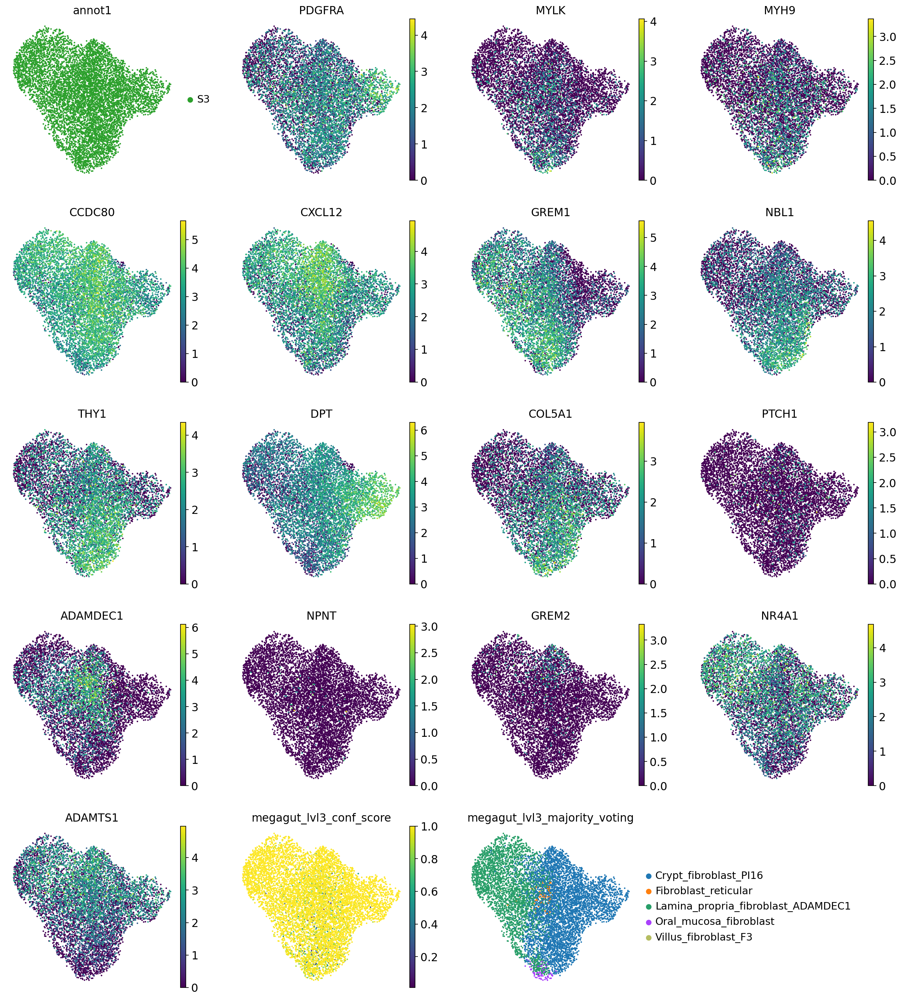

In [27]:
sc.pl.umap(
    adata_sub,
    color=['annot1',
        # fibroblast vs contractile markers   
        "PDGFRA", "MYLK", "MYH9", "CCDC80", "CXCL12",
        # S3_oral_mucosal_fibro markers
        'GREM1', 'NBL1', 'THY1', 'DPT', 'COL5A1',
        # myofibroblast markers
        'PTCH1', 'ADAMDEC1', 'NPNT', 'GREM2', 'NR4A1', 'ADAMTS1',
        "megagut_lvl3_conf_score", "megagut_lvl3_majority_voting"],
#    palette='tab10',
    frameon=False,
    size=15,  # point size
#    add_outline=True,
    #legend_loc='on data',
    save="_myofibroblasts_CellTypist_S3subset.pdf"
    #save='UMAP_RNA_fibroblast_MF_PC_outline.pdf'  # in ./figures
)

In [24]:
adata_sub.obs.megagut_lvl3_majority_voting.value_counts()

Crypt_fibroblast_PI16                 5072
Lamina_propria_fibroblast_ADAMDEC1    3034
Oral_mucosa_fibroblast                  98
Fibroblast_reticular                    90
Villus_fibroblast_F3                     1
Name: megagut_lvl3_majority_voting, dtype: int64